# Mouse snRNA Annotation
## Adrenal

In [1]:
library(Matrix)
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(viridis))
library(RColorBrewer)
library(data.table)
options(future.globals.maxSize = 10000 * 1024^2)
future.seed=TRUE
source("plotting_functions.R")

Warning message in system("timedatectl", intern = TRUE):
"running command 'timedatectl' had status 1"

Attaching package: 'data.table'


The following objects are masked from 'package:dplyr':

    between, first, last


The following object is masked from 'package:purrr':

    transpose




In [2]:
system("mkdir ../../plots/")
system("mkdir ../../plots/qc")
system("mkdir ../../plots/clustering")
system("mkdir ../../plots/annotation")

In [3]:
tissue = "adrenal"
abrv = "A"
synapse_id = "EAID_000084"
enc_abrv = "ADGL"

# Read in data

In [4]:
obj = readRDS(paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))
obj$sample = factor(obj$sample, 
                    levels = paste0(abrv,"_",rep(c("4","10","14","25","36","2m","18m"),each=4),rep(c("_M","_F"),each=2),c("_1","_2")))


In [5]:
obj

An object of class Seurat 
82795 features across 83468 samples within 3 assays 
Active assay: SCT (32088 features, 0 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [6]:
Idents(obj) = obj$seurat_clusters

In [7]:
sample_cols = spectral_cols(obj@meta.data,"sample")
cluster_cols = set1_cols(obj@meta.data,"seurat_clusters")
depth2_cols = c("#01a0de","#d885ce","#7f1c72")
tech_cols = c("#01a0de","#7f1c72")
sex_cols = c("#f8b4c5","#2900ff")
annot_cols = read.csv("../../../../figures/data/enc4_mouse_snrna_celltypes.csv")
annot_cols = annot_cols[annot_cols$tissue == str_to_title(tissue),]

### Violin plot of QC metrics split by single cell platform

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



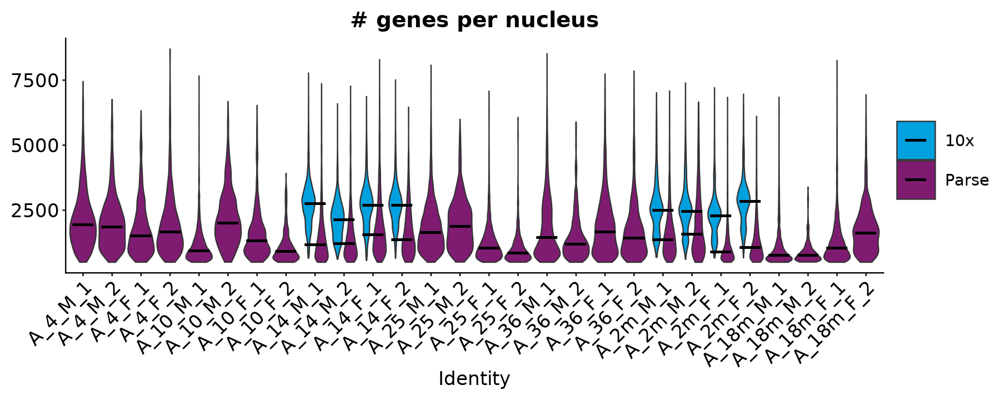

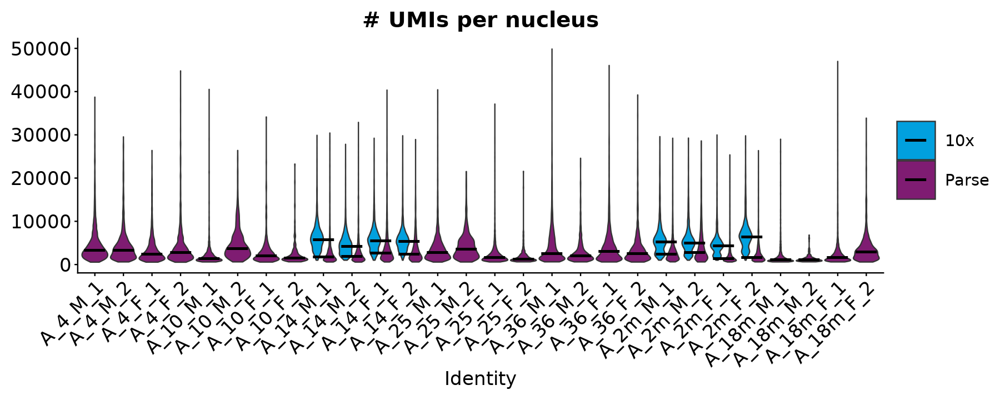

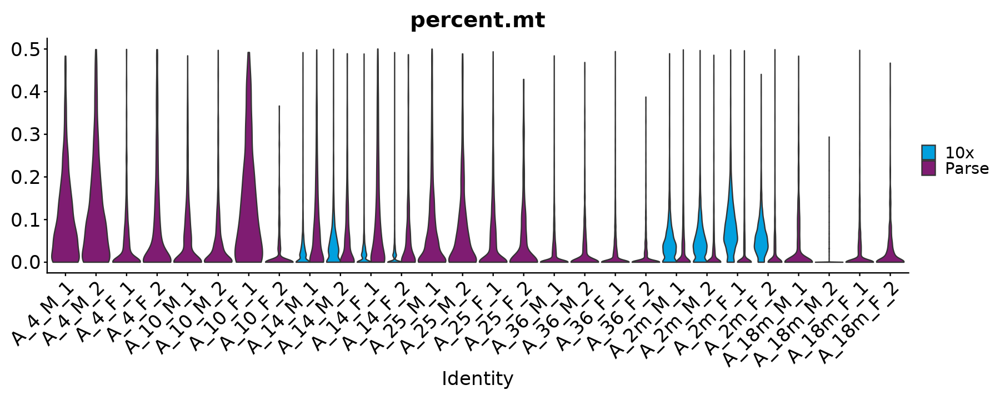

In [8]:
options(repr.plot.width = 15, repr.plot.height = 6)
p = VlnPlot(obj, features = c("nFeature_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample")+ ggtitle("# genes per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20),
              axis.text.x = element_text(size = 20),
              axis.text.y = element_text(size = 20))

p1 = VlnPlot(obj, features = c("nCount_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + ggtitle("# UMIs per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20), 
              axis.text.x = element_text(size = 20), 
              axis.text.y = element_text(size = 20))

p2 = VlnPlot(obj, features = c("percent.mt"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + 
        scale_fill_manual(values = tech_cols) +
        theme(text = element_text(size = 20),
                axis.text.x = element_text(size = 20),
                axis.text.y = element_text(size = 20))
p
p1
p2

In [9]:
pdf(file="../../plots/qc/experiment_violinplots.pdf", width = 15, height = 6)
p
p1
p2
dev.off()

png 
  2

## UMAP "Feature Plots" of QC metadata

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



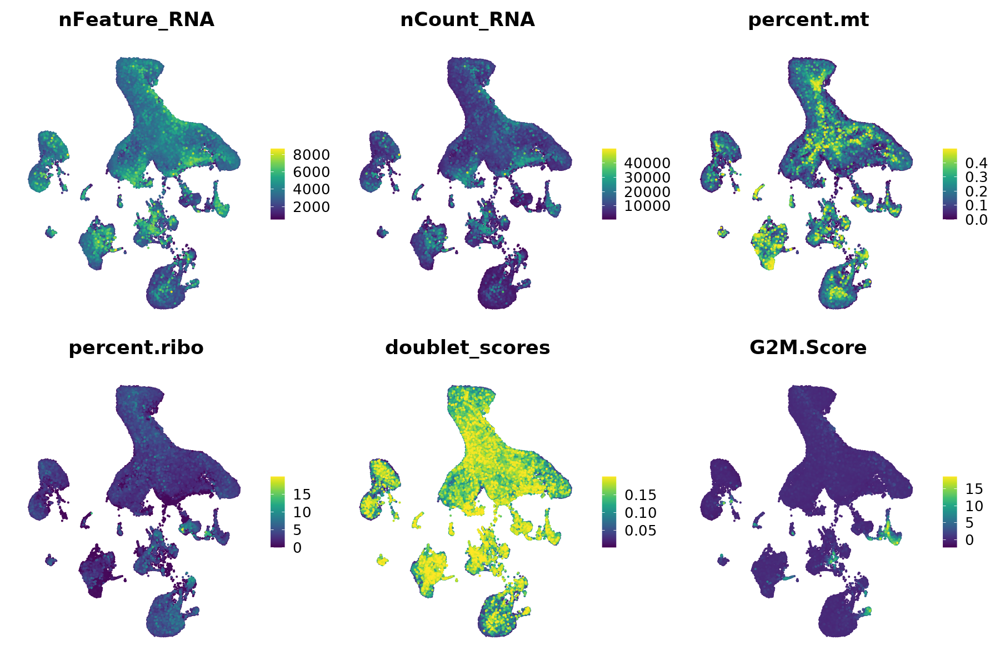

In [10]:
options(repr.plot.width = 15, repr.plot.height = 10)

featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))

In [11]:
pdf(file="../../plots/qc/qc_featureplot.png", width = 15, height = 10)
featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

# Check integration and clustering

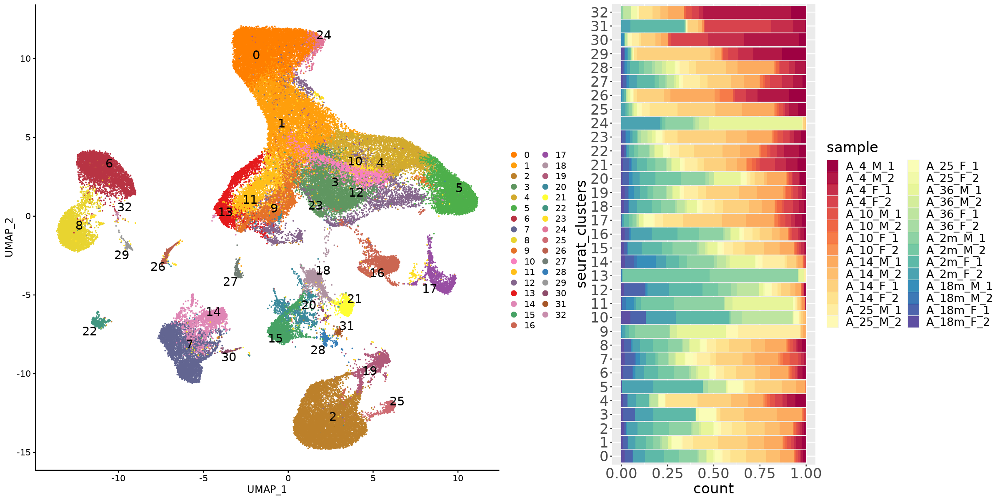

In [12]:
options(repr.plot.width = 20, repr.plot.height = 10)

p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = cluster_cols)

p2=ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


In [13]:
pdf(file="../../plots/clustering/UMAP_cluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

png 
  2

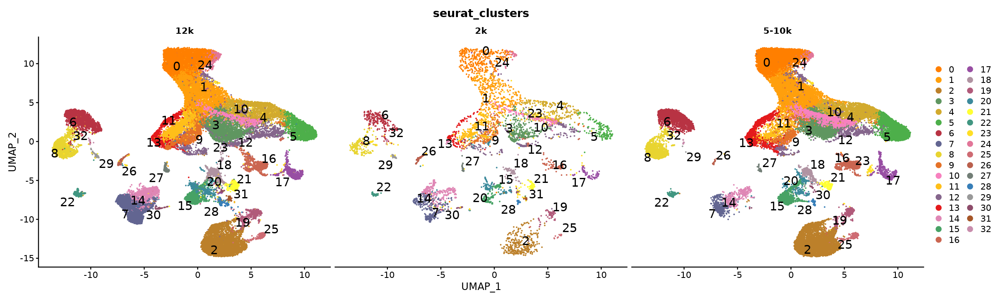

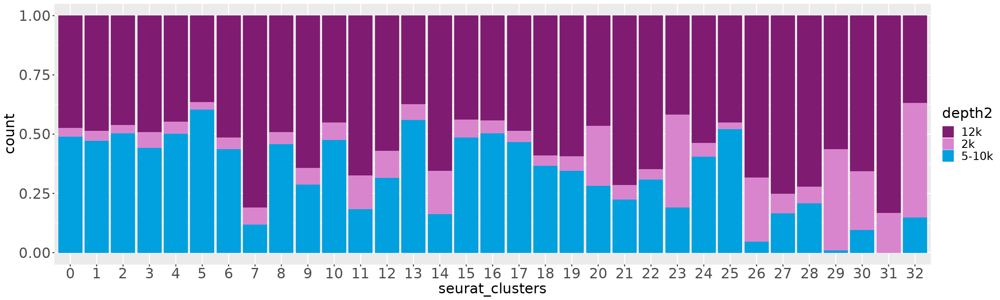

In [14]:
options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "seurat_clusters",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = cluster_cols)
p1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = rev(depth2_cols)) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))

p
p1

In [15]:
pdf(file="../../plots/clustering/Parse_10x_experiment_distribution.pdf",
    width = 20, height = 6)
p
p1
dev.off()

png 
  2

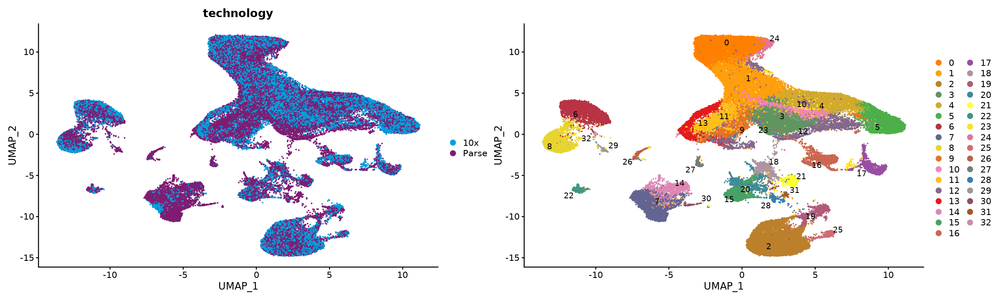

In [16]:
p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = cluster_cols)
p1 + p2

In [17]:
pdf(file="../../plots/clustering/UMAP_Parse_10x.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

png 
  2

Warning message:
"ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


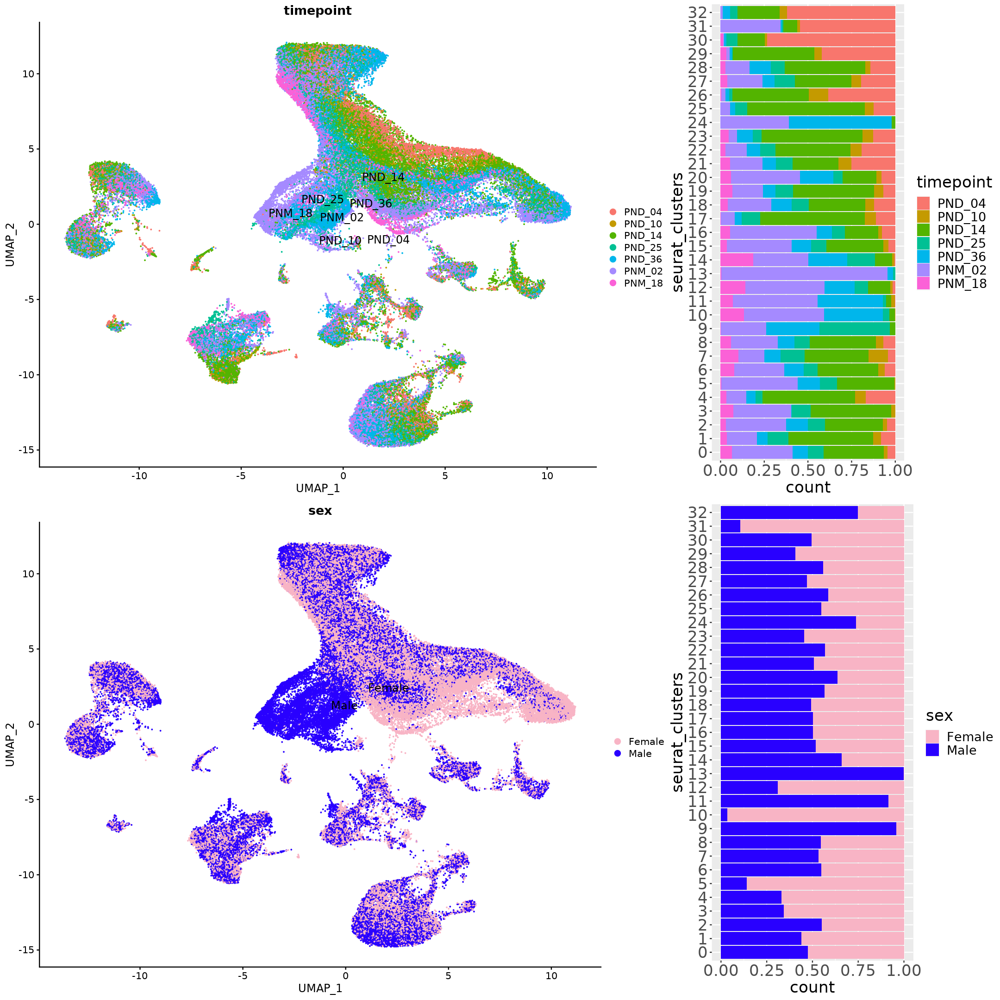

In [18]:
options(repr.plot.width = 18, repr.plot.height = 18)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))



In [19]:
pdf(file="../../plots/clustering/UMAP_age_sex_barplot.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()

png 
  2

# Celltype annotation

In [20]:
DefaultAssay(obj) = "SCT"

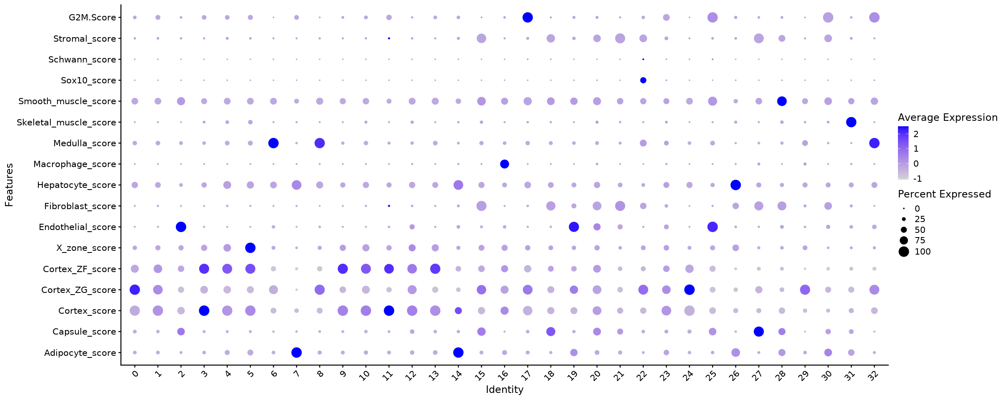

In [21]:
markers = read.csv("../../../ref/IGVF_curated_markers.csv")
markers = markers[markers$Tissue == str_to_title(tissue),]
markers = markers[markers$Gene %in% rownames(obj),]

for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 20, repr.plot.height= 8)
Idents(obj) = obj$seurat_clusters
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [22]:
pdf(file="../../plots/annotation/cluster_marker_dotplot.pdf",width = 20, height = 8)
p
dev.off()

png 
  2

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



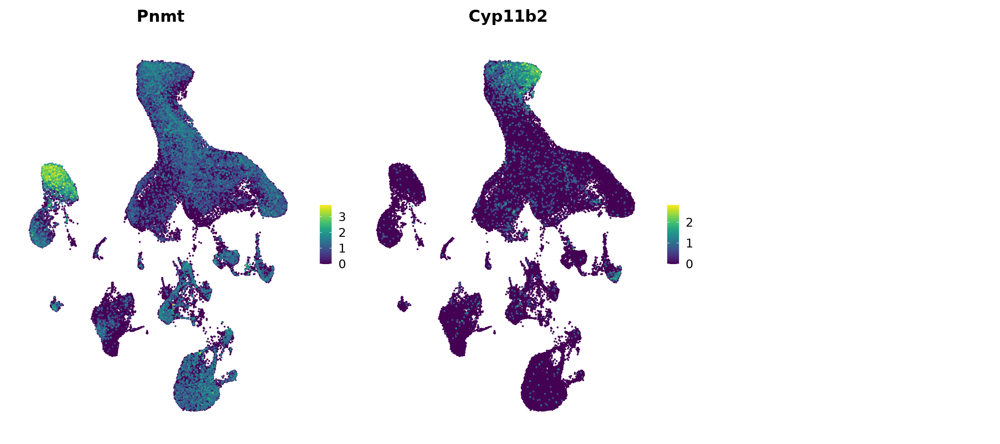

In [23]:
options(repr.plot.width = 18, repr.plot.height= 8)

featureplot(obj,c("Pnmt","Cyp11b2"))


In [24]:
pdf(file="../../plots/annotation/celltype_featureplot.pdf",width = 18, height = 8)
featureplot(obj,c("Pnmt","Cyp11b2"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

## Order clusters

In [25]:
Idents(obj) = obj$seurat_clusters
order = c(7,14, # adipo
          30, # cycling adipo
          27, # capsule
          24,0, # cortex_ZG
          1,3,23,12,10,4,# cortex_ZF
          5, # x_zone
          9,11,13, # male_only_zf
          17, # cycling cortex
          2,19, # endo
          25, # cycling endo
          18,21, # fibroblast
          26, # hepato
          16, # macrophage
          6, # medulla_EPI
          8, # medulla_NE
          32,29, # medulla_early
          31, # skel. muscle
          28, # smooth muscle
          22, # sox10
          15,20 # stromal
          )
Idents(obj) = factor(Idents(obj), levels = order)


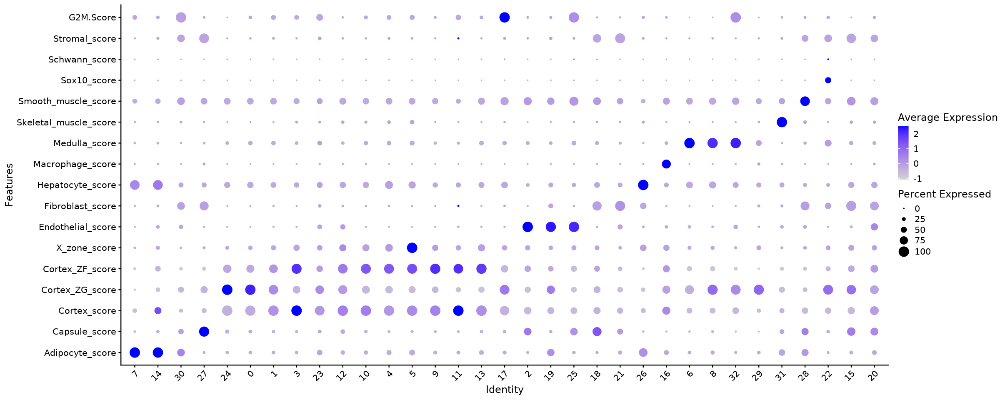

In [26]:
options(repr.plot.width = 20, repr.plot.height= 8)
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [27]:
pdf(file="../../plots/annotation/cluster_marker_dotplot_sorted.pdf",width = 20, height = 8)
p
dev.off()

png 
  2

## Name clusters

In [28]:
subtypes = c(rep("Adipocyte",2), #7,14,
              "Adipocyte_cycling",
              "Capsule", #27
              rep("Cortex_ZG",2), # 24, 0_1
              rep("Cortex_ZF",6), # 0_0,1,3,23,12,10,4
              "X_zone", # 5
              rep("Male_only_ZF",3), #9,11,13
              "Cortex_cycling", #17,
              rep("Endothelial",2), #2,19
              "Endothelial_cycling", # 25
              rep("Fibroblast",2), #18,21
              "Hepatocyte", # 26
              "Macrophage", # 16
              "Medulla_EPI", # 6
              "Medulla_NE", # 8
              rep("Medulla_early",2), #32,29,
              "Skeletal_muscle", # 31
              "Smooth_muscle", # 28
              "Sox10", # 22
              rep("Stromal",2) #15,20
              )
names(subtypes) = levels(Idents(obj))
obj = RenameIdents(obj, subtypes)
order = c("Adipocyte","Adipocyte_cycling",
          "Capsule",
          "Cortex_ZG","Cortex_ZF","X_zone","Male_only_ZF","Cortex_cycling",
          "Endothelial","Endothelial_cycling",
          "Fibroblast","Hepatocyte","Macrophage",
          "Medulla_EPI","Medulla_NE","Medulla_early",
          "Skeletal_muscle","Smooth_muscle","Sox10","Stromal")
Idents(obj) = factor(Idents(obj), levels = order)
obj$subtypes = Idents(obj)
table(obj$subtypes)

obj$celltypes = obj$subtypes
obj$celltypes = gsub("Cortex_ZF","Cortex",obj$celltypes)
obj$celltypes = gsub("Cortex_ZG","Cortex",obj$celltypes)
obj$celltypes = gsub("X_zone","Cortex",obj$celltypes)
obj$celltypes = gsub("Cortex_cycling","Cortex",obj$celltypes)
obj$celltypes = gsub("Male_only_ZF","Cortex",obj$celltypes)
obj$celltypes = gsub("Endothelial_cycling","Endothelial",obj$celltypes)
obj$celltypes = gsub("Adipocyte_cycling","Adipocyte",obj$celltypes)
obj$celltypes = gsub("Fibroblast_cycling","Fibroblast",obj$celltypes)
obj$celltypes = gsub("Medulla_NE","Medulla",obj$celltypes)
obj$celltypes = gsub("Medulla_EPI","Medulla",obj$celltypes)
obj$celltypes = gsub("Medulla_early","Medulla",obj$celltypes)
order = c("Adipocyte",
          "Capsule",
          "Cortex",
          "Endothelial",
          "Fibroblast","Hepatocyte","Macrophage",
          "Medulla",
          "Skeletal_muscle","Smooth_muscle","Sox10","Stromal")
obj$celltypes = factor(obj$celltypes, levels = order)
table(obj$celltypes)

obj$gen_celltype = obj$celltypes
obj$gen_celltype = gsub("Macrophage","Immune",obj$gen_celltype)
obj$gen_celltype = gsub("Skeletal_muscle","Myonuclei",obj$gen_celltype)
order = c("Adipocyte",
          "Capsule",
          "Cortex",
          "Endothelial",
          "Fibroblast","Hepatocyte","Immune",
          "Medulla",
          "Myonuclei","Smooth_muscle","Sox10","Stromal")
obj$gen_celltype = factor(obj$gen_celltype, levels = order)
table(obj$gen_celltype)


          Adipocyte   Adipocyte_cycling             Capsule           Cortex_ZG 
               6295                 158                 340               10302 
          Cortex_ZF              X_zone        Male_only_ZF      Cortex_cycling 
              25137                4505                8104                1572 
        Endothelial Endothelial_cycling          Fibroblast          Hepatocyte 
               9830                 441                2181                 347 
         Macrophage         Medulla_EPI          Medulla_NE       Medulla_early 
               1995                4274                3230                 315 
    Skeletal_muscle       Smooth_muscle               Sox10             Stromal 
                126                 327                 662                3327 


      Adipocyte         Capsule          Cortex     Endothelial      Fibroblast 
           6453             340           49620           10271            2181 
     Hepatocyte      Macrophage         Medulla Skeletal_muscle   Smooth_muscle 
            347            1995            7819             126             327 
          Sox10         Stromal 
            662            3327 


    Adipocyte       Capsule        Cortex   Endothelial    Fibroblast 
         6453           340         49620         10271          2181 
   Hepatocyte        Immune       Medulla     Myonuclei Smooth_muscle 
          347          1995          7819           126           327 
        Sox10       Stromal 
          662          3327 

## Update metadata for integration with other ENCODE data
submission_celltype, cell_type_mnemonic, CL_ID_annotation

In [29]:
obj$submission_celltype  = obj$subtypes
obj$submission_celltype = gsub("Adipocyte_cycling","adipocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Adipocyte","adipocyte",obj$submission_celltype)
obj$submission_celltype = gsub("X_zone","Cortex_ZF",obj$submission_celltype)
obj$submission_celltype = gsub("Male_only_ZF","Cortex_ZF",obj$submission_celltype)
obj$submission_celltype = gsub("Cortex_cycling","Cortex_ZF",obj$submission_celltype)
obj$submission_celltype = gsub("Cortex_ZF","zona fasciculata cell",obj$submission_celltype)
obj$submission_celltype = gsub("Cortex_ZG","zona glomerulosa cell",obj$submission_celltype)
obj$submission_celltype = gsub("Endothelial_cycling","Endothelial",obj$submission_celltype)
obj$submission_celltype = gsub("Endothelial","endothelial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Medulla_early","Medulla",obj$submission_celltype)
obj$submission_celltype = gsub("Medulla_EPI","Medulla",obj$submission_celltype)
obj$submission_celltype = gsub("Medulla_NE","Medulla",obj$submission_celltype)
obj$submission_celltype = gsub("Medulla","adrenal medulla chromaffin cell",obj$submission_celltype)
obj$submission_celltype = gsub("Macrophage","macrophage",obj$submission_celltype)
obj$submission_celltype = gsub("Stromal","adrenal stromal cell",obj$submission_celltype)
obj$submission_celltype = gsub("Capsule","adrenal capsule cell",obj$submission_celltype)
obj$submission_celltype = gsub("Fibroblast","fibroblast",obj$submission_celltype)
obj$submission_celltype = gsub("Hepatocyte","hepatocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Skeletal_muscle","skeletal muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Smooth_muscle","smooth muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Sox10","adrenal medulla progenitor cell (Sox10+)",obj$submission_celltype)
table(obj$submission_celltype)

obj$cell_type_mnemonic  = obj$submission_celltype
obj$cell_type_mnemonic = gsub("adipocyte","ADIP_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("adrenal capsule cell","AD_CP",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("adrenal medulla chromaffin cell","AD_MD",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("adrenal medulla progenitor cell \\(Sox10\\+\\)","AD_SX",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("adrenal stromal cell","AD_ST",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("endothelial cell","ENDO_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("fibroblast","FIB_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("hepatocyte","HEPT_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("macrophage","MACRO_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("skeletal muscle cell","SKMU_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("smooth muscle cell","SMC_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("zona fasciculata cell","ZF_ADGL",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("zona glomerulosa cell","ZG_ADGL",obj$cell_type_mnemonic)
table(obj$cell_type_mnemonic)

obj$CL_ID_annotation  = obj$cell_type_mnemonic
obj$CL_ID_annotation = gsub("ADIP_ADGL","CL:0000136",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("AD_CP","CL:0008019",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("AD_MD","CL:0000336",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("AD_SX","CL:0000336",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("AD_ST","CL:0000499",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDO_ADGL","CL:0000115",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("FIB_ADGL","CL:0000057",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("HEPT_ADGL","CL:0000182",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("MACRO_ADGL","CL:0000235",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SKMU_ADGL","CL:0000188",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SMC_ADGL","CL:0000192",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ZF_ADGL","CL:0002136",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ZG_ADGL","CL:0002099",obj$CL_ID_annotation)
table(obj$CL_ID_annotation)

obj$synapse = synapse_id
obj$tissue_mnemonic = enc_abrv



                               adipocyte 
                                    6453 
                    adrenal capsule cell 
                                     340 
         adrenal medulla chromaffin cell 
                                    7819 
adrenal medulla progenitor cell (Sox10+) 
                                     662 
                    adrenal stromal cell 
                                    3327 
                        endothelial cell 
                                   10271 
                              fibroblast 
                                    2181 
                              hepatocyte 
                                     347 
                              macrophage 
                                    1995 
                    skeletal muscle cell 
                                     126 
                      smooth muscle cell 
                                     327 
                   zona fasciculata cell 
                                 


 ADIP_ADGL      AD_CP      AD_MD      AD_ST      AD_SX  ENDO_ADGL   FIB_ADGL 
      6453        340       7819       3327        662      10271       2181 
 HEPT_ADGL MACRO_ADGL  SKMU_ADGL   SMC_ADGL    ZF_ADGL    ZG_ADGL 
       347       1995        126        327      39318      10302 


CL:0000057 CL:0000115 CL:0000136 CL:0000182 CL:0000188 CL:0000192 CL:0000235 
      2181      10271       6453        347        126        327       1995 
CL:0000336 CL:0000499 CL:0002099 CL:0002136 CL:0008019 
      8481       3327      10302      39318        340 

# Annotated plots

In [30]:
subtype_cols = annot_cols[match(levels(obj$subtypes),annot_cols$subtypes),"subtype_color"]
celltype_cols = annot_cols[match(levels(obj$celltypes),annot_cols$celltypes),"celltype_color"]
gen_celltype_cols = annot_cols[match(levels(obj$gen_celltype),annot_cols$gen_celltype),"gen_celltype_color"]

Warning message:
"ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


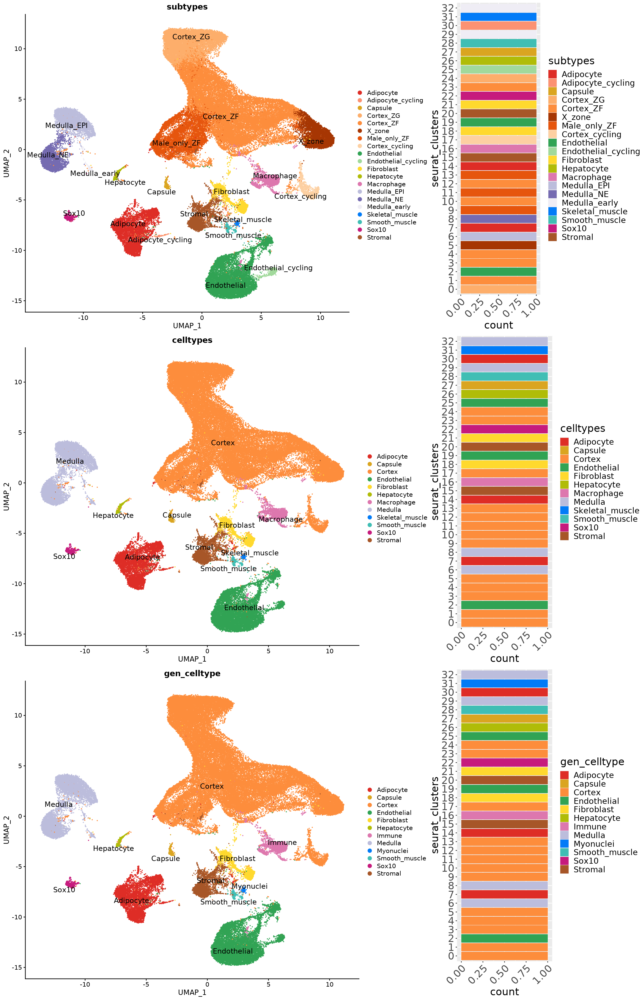

In [31]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap_subtypes = DimPlot(obj, reduction = "umap", group.by = "subtypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = subtype_cols)
cluster_subtypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=subtypes)) + 
    scale_fill_manual(values = subtype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


umap_celltypes = DimPlot(obj, reduction = "umap", group.by = "celltypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = celltype_cols)
cluster_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=celltypes)) + 
    scale_fill_manual(values = celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap_gen_celltypes = DimPlot(obj, reduction = "umap", group.by = "gen_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = gen_celltype_cols)
cluster_gen_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=gen_celltype)) + 
    scale_fill_manual(values = gen_celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [32]:
pdf(file="../../plots/annotation/UMAPs_barplots.pdf",width = 18,height=28)

gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))

dev.off()

png 
  2

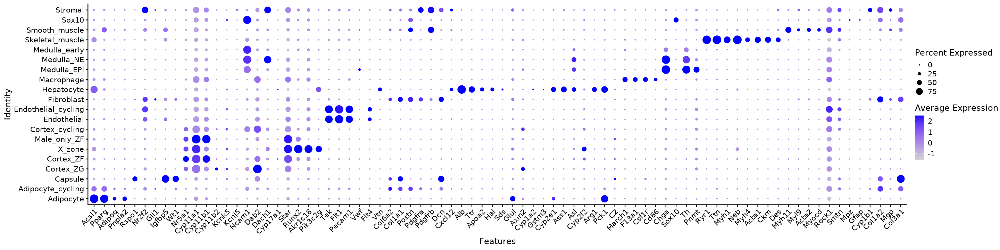

In [33]:
options(repr.plot.width = 24, repr.plot.height = 6)

Idents(obj) = obj$subtypes
p = DotPlot(obj, features =  unique(markers$Gene)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
p


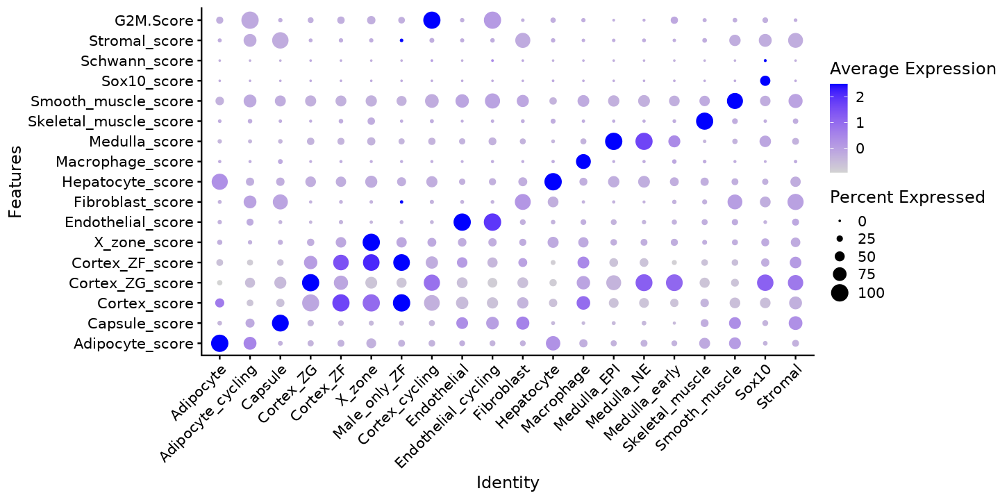

In [34]:
options(repr.plot.width = 12, repr.plot.height = 6)

p1 = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 

p1


In [35]:
pdf(file="../../plots/annotation/subtypes_marker_dotplot.pdf",width = 24, height = 6)
p
dev.off()

png 
  2

In [36]:
pdf(file="../../plots/annotation/subtypes_marker_score_dotplot.pdf",width = 12, height = 6)
p1
dev.off()

png 
  2

Warning message:
"ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


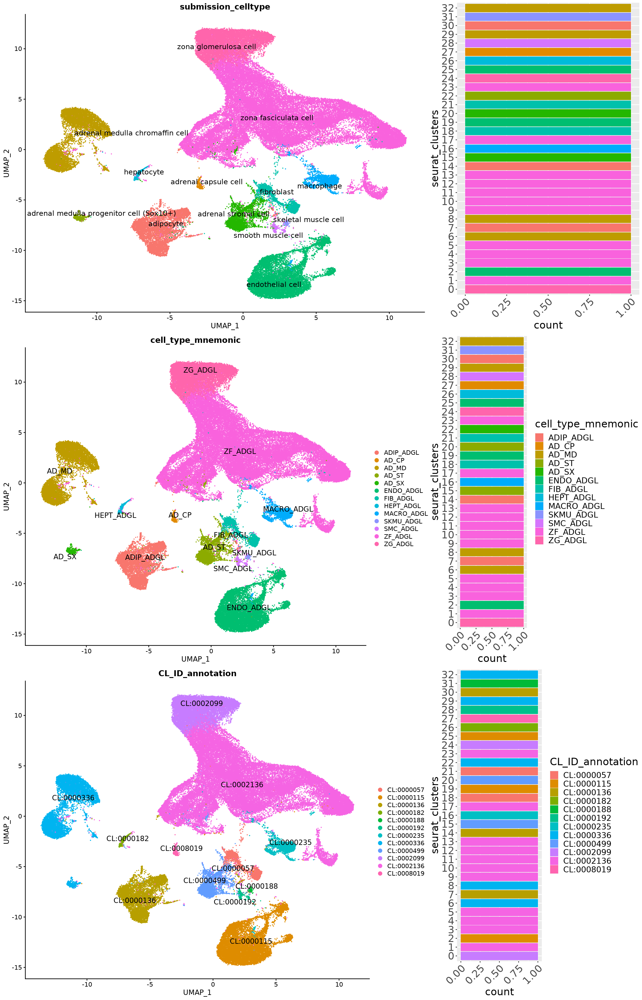

In [37]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap1 = DimPlot(obj, reduction = "umap", group.by = "submission_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) & NoLegend()
cluster1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=submission_celltype)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()& NoLegend()


umap2 = DimPlot(obj, reduction = "umap", group.by = "cell_type_mnemonic", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=cell_type_mnemonic)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap3 = DimPlot(obj, reduction = "umap", group.by = "CL_ID_annotation", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster3 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=CL_ID_annotation)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [38]:
pdf(file="../../plots/annotation/UMAPs_barplots_submissions.pdf",
    width = 18, height = 28)
gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))
dev.off()


png 
  2

## Get ENC dataset (experiment_accession) from enc4_mouse_metadata_fixed.csv

In [46]:
expt_acc = read.csv("../../../ref/enc4_mouse_metadata_fixed.csv")
expt_acc = expt_acc[,c("sublibrary_sample","rna_experiment_accession")]

In [47]:
seurat_metadata = obj@meta.data
seurat_metadata$rna_experiment_accession = NULL

In [48]:
seurat_metadata = left_join(seurat_metadata,expt_acc,by="sublibrary_sample")

In [49]:
obj$rna_experiment_accession = seurat_metadata$rna_experiment_accession

In [50]:
table(obj$rna_experiment_accession)


ENCSR021YYL ENCSR035ZCY ENCSR049KDI ENCSR093CLX ENCSR097PDV ENCSR108ZIJ 
       3981          84          19         505        3903        4680 
ENCSR111SCI ENCSR148VQR ENCSR157YJO ENCSR165FLF ENCSR165VMQ ENCSR196TWX 
        689         257        4537        2440         184         171 
ENCSR201SNQ ENCSR216UTT ENCSR224OUG ENCSR263VNQ ENCSR291RIX ENCSR312AOC 
        348         391        3105         351          89        1968 
ENCSR356VJZ ENCSR358SBF ENCSR396XOO ENCSR402GQZ ENCSR402PHR ENCSR403MNL 
       4363         125        2951         353        5139         306 
ENCSR422JWZ ENCSR452BKB ENCSR454ZHR ENCSR472OOH ENCSR526LFP ENCSR551OZP 
        200         290         260         154         859          29 
ENCSR552XCF ENCSR575TNG ENCSR627TLB ENCSR662TPD ENCSR693KAV ENCSR711CNO 
        142         327          74        1810        4391         160 
ENCSR711LRI ENCSR732MDJ ENCSR749GDE ENCSR763LIT ENCSR773CKJ ENCSR776XMP 
       4423         138        3968          36   

# Save

In [51]:
saveRDS(obj,file=paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))


In [52]:
write.csv(obj@meta.data,file=paste0("../../seurat/",str_to_lower(tissue),"_Parse_10x_integrated_metadata.csv"))



In [53]:
obj_parse = subset(obj, subset = technology == "Parse")
saveRDS(obj_parse, file = paste0("../../seurat/",tissue,"_Parse.rds"))

obj_10x = subset(obj, subset = technology == "10x")
saveRDS(obj_10x, file = paste0("../../seurat/",tissue,"_10x.rds"))


In [54]:
write.csv(obj_parse@meta.data, file=paste0("../../seurat/",tissue,"_Parse_metadata.csv"))

write.csv(obj_10x@meta.data, file=paste0("../../seurat/",tissue,"_10x_metadata.csv"))



# Subset for regulatory genes & save matrices for input into Topyfic

In [55]:
reg_genes = read.csv("../../../ref/gene_display_table_expressed_7categories.csv")

In [56]:
table(reg_genes$gene_name %in% rownames(obj@assays$RNA@counts))


TRUE 
2701 

In [57]:
mtx_parse = obj_parse@assays$RNA@counts
mtx_parse = mtx_parse[rownames(mtx_parse) %in% reg_genes$gene_name, ]
mtx_parse = mtx_parse[match(reg_genes$gene_name, rownames(mtx_parse)), ]

mtx_10x = obj_10x@assays$RNA@counts
mtx_10x = mtx_10x[rownames(mtx_10x) %in% reg_genes$gene_name, ]
mtx_10x = mtx_10x[match(reg_genes$gene_name, rownames(mtx_10x)), ]

In [58]:
table(rownames(mtx_parse) == reg_genes$gene_name)
table(rownames(mtx_10x) == reg_genes$gene_name)


TRUE 
2701 


TRUE 
2701 

In [59]:
writeMM(mtx_parse, file=paste0("../../seurat/",tissue,"_Parse.mtx"))

writeMM(mtx_10x, file=paste0("../../seurat/",tissue,"_10x.mtx"))



NULL

NULL